# **AI for AR modeling demonstration**
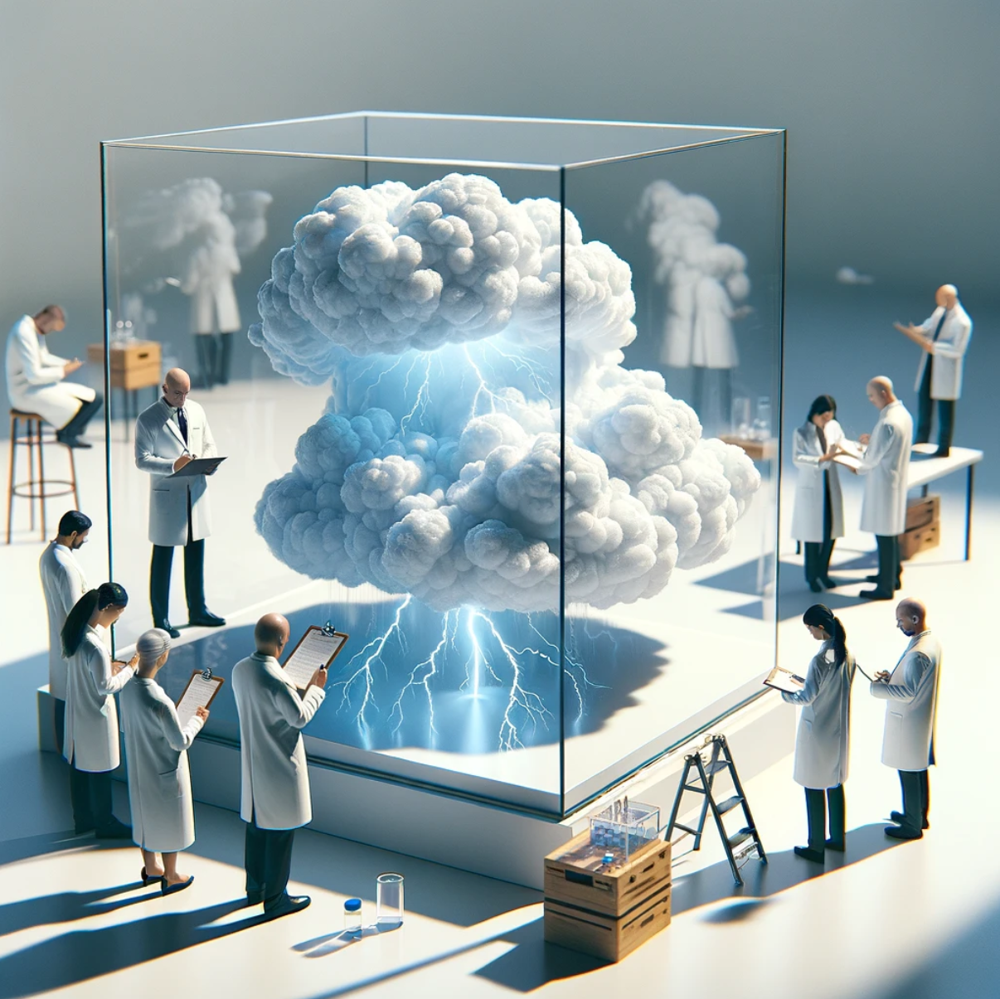




---



This notebook will go over the basics of running AI models focused on AR events with Google Colab's free tier resources.



---



**About AI weather modeling:**
The numerical models used to predict weather are large, complex, and computationally demanding and do not learn from past weather patterns. Lam et al. introduced a machine learning–based method that has been trained directly from reanalysis data of past atmospheric conditions (https://www.science.org/doi/10.1126/science.adi2336).



---


**Setup runtime:**
Click the down arrow in the top right and select "Change runtime type." This notebook will work with both CPU and T4 GPU. Both are free resources and T4GPU may not be available during peak use. There is an option to buy accelerated resources in Google Collab for A100 GPU, L4 GPU, and v5e-1 TPU (not tested yet).
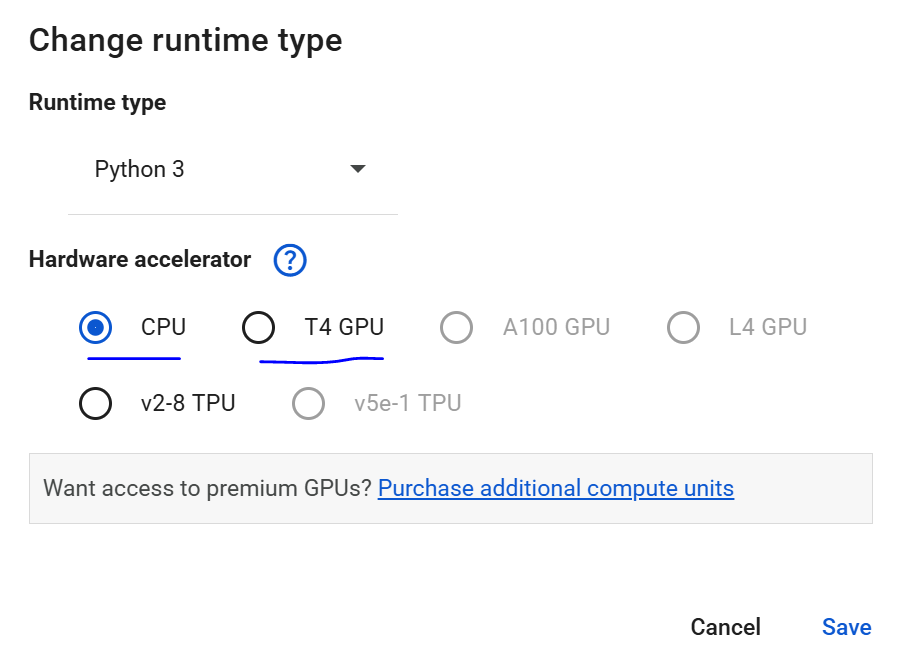



---


**Acknowledgments:**

Graphcast: https://github.com/google-deepmind/graphcast

Jacob Radford: Original Notebook Author and GRIB-Netcdf conversion method




#Important: When using CPU, there will be a prompt that asks you to
#"Restart Session." Click "Restart Session" when prompted to continue

---

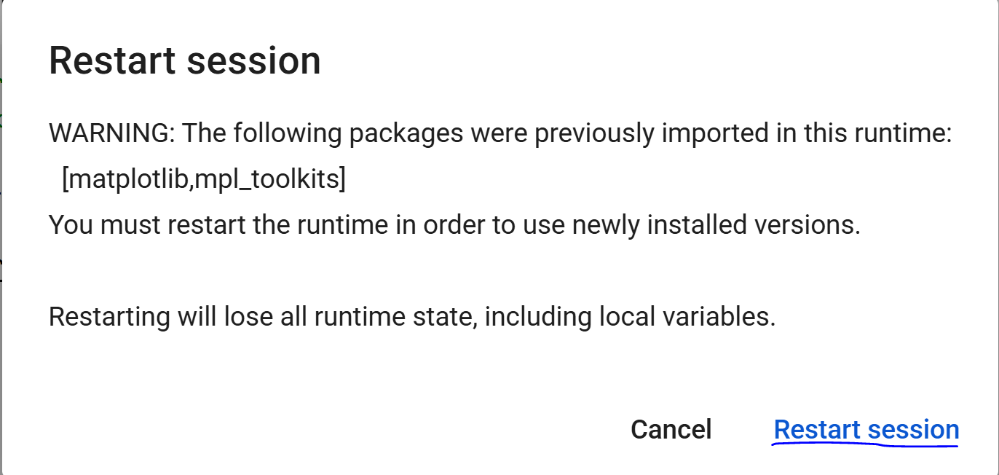

In [ ]:
#@title Install packages and import needed libraries (2.5 mins)

#Important: When using CPU, there will be a prompt that asks you to
#"Restart Session." Click "Restart Session" when prompted to continue


!pip install ai-models-gfs ai-models-graphcast-gfs
!pip install basemap basemap-data-hires
!pip install git+https://github.com/deepmind/graphcast.git
!pip install --upgrade jaxlib
!pip install --upgrade chex
!pip install netcdf4
!pip install xarray pygrib GDAL awscli
!pip install ai-models-fourcastnetv2-gfs
!pip install ai-models-panguweather-gfs
!pip install ai-models-aurora-gfs

import numpy as np
import pygrib as pg
import ipywidgets as widgets
import math
import datetime
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.basemap import Basemap, shiftgrid
from IPython.display import HTML
from typing import Optional
from netCDF4 import Dataset as DS
import os
import xarray as xr

  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.3.1
    Uninstalling numpy-2.3.1:
      Successfully uninstalled numpy-2.3.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dinosaur-dycore 1.2.1 requires jaxlib, which is not installed.
jraph 0.0.6.dev0 requires jaxlib>=0.1.37, which is not installed.
optax 0.2.5 requires jaxlib>=0.4.27, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
chex 0.1.89 requires jaxlib>=0.4.27, which is not installed.
jax 0.5.2 requires jaxlib<=0.5.2,>=0.5.1, which is not installed.
basemap 2.0.0 requires numpy<2.4,>=2.0, but you have numpy 1.26.4 which is incompatible.
thinc

  Cloning https://github.com/deepmind/graphcast.git to /tmp/pip-req-build-lxdzmont
  Running command git clone --filter=blob:none --quiet https://github.com/deepmind/graphcast.git /tmp/pip-req-build-lxdzmont
  Resolved https://github.com/deepmind/graphcast.git to commit 5e63ba030f6438d0a97521b30360b7c95d28796a
  Preparing metadata (setup.py) ... done
  Using cached jaxlib-0.6.2-cp311-cp311-manylinux2014_x86_64.whl.metadata (1.3 kB)
  Using cached jaxlib-0.5.1-cp311-cp311-manylinux2014_x86_64.whl.metadata (978 bytes)
Using cached jaxlib-0.5.1-cp311-cp311-manylinux2014_x86_64.whl (105.1 MB)
  Using cached jaxlib-0.6.2-cp311-cp311-manylinux2014_x86_64.whl.metadata (1.3 kB)
Using cached jaxlib-0.6.2-cp311-cp311-manylinux2014_x86_64.whl (89.9 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.5.2 requires jaxlib<=0.5.2,>=0.5.1, but you have jaxlib 0.6.2 which

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

In [ ]:
#@title Pre-install the AI resources (2 mins)
!aws s3 cp --recursive --no-sign-request s3://noaa-oar-mlwp-data/colab_resources/gc ./gc/
!aws s3 cp --recursive --no-sign-request s3://noaa-oar-mlwp-data/colab_resources/fcnv2 ./fcnv2/
!aws s3 cp --recursive --no-sign-request s3://noaa-oar-mlwp-data/colab_resources/pw ./pw/
!aws s3 cp --recursive --no-sign-request s3://noaa-oar-mlwp-data/colab_resources/au ./au/

download: s3://noaa-oar-mlwp-data/colab_resources/gc/stats/stddev_by_level.nc to gc/stats/stddev_by_level.nc
download: s3://noaa-oar-mlwp-data/colab_resources/gc/stats/mean_by_level.nc to gc/stats/mean_by_level.nc
download: s3://noaa-oar-mlwp-data/colab_resources/gc/stats/diffs_stddev_by_level.nc to gc/stats/diffs_stddev_by_level.nc
download: s3://noaa-oar-mlwp-data/colab_resources/gc/params/GraphCast_small - ERA5 1979-2015 - resolution 1.0 - pressure levels 13 - mesh 2to5 - precipitation input and output.npz to gc/params/GraphCast_small - ERA5 1979-2015 - resolution 1.0 - pressure levels 13 - mesh 2to5 - precipitation input and output.npz
download: s3://noaa-oar-mlwp-data/colab_resources/gc/params/GraphCast_operational - ERA5-HRES 1979-2021 - resolution 0.25 - pressure levels 13 - mesh 2to6 - precipitation output only.npz to gc/params/GraphCast_operational - ERA5-HRES 1979-2021 - resolution 0.25 - pressure levels 13 - mesh 2to6 - precipitation output only.npz
download: s3://noaa-oar-m

# **Run the AI model for 1 degree Graphcast**
Github: https://github.com/google-deepmind/graphcast

**This package provides three pretrained models:**

1. GraphCast, the high-resolution model used in the GraphCast paper (0.25 degree resolution, 37 pressure levels), trained on ERA5 data from 1979 to 2017,

2. GraphCast_small, a smaller, low-resolution version of GraphCast (1 degree resolution, 13 pressure levels, and a smaller mesh), trained on ERA5 data from 1979 to 2015, useful to run a model with lower memory and compute constraints,

3. GraphCast_operational, a high-resolution model (0.25 degree resolution, 13 pressure levels) pre-trained on ERA5 data from 1979 to 2017 and fine-tuned on HRES data from 2016 to 2021. This model can be initialized from HRES data (does not require precipitation inputs).

Leveraging ECMWF ai-models-graphcast (plugin to run Google Deepmind's GraphCast): https://github.com/ecmwf-lab/ai-models-graphcast


In [ ]:
#@title Run the AI model for 1° graphcast (4 mins)
model = "graphcast-1p00"
output_path = f"./{model}_20230221_0000"
model2assets = {
    "graphcast":"./gc",
    "graphcast-1p00":"./gc"
}
assets = model2assets[model]
!ai-models-gfs --input "gfs" --date "20230221" --time "0000" --assets {assets} --path {output_path} --lead "240" "graphcast-1p00"


2025-06-26 22:54:45,606 INFO NumExpr defaulting to 2 threads.
2025-06-26 22:54:49,167 INFO Writing results to ./graphcast-1p00_20230221_0000
2025-06-26 22:54:49,167 INFO Loading surface fields from GFS
2025-06-26 22:54:51,606 INFO Downloading https://noaa-gfs-bdp-pds.s3.amazonaws.com/gfs.20230220/18/atmos/gfs.t18z.pgrb2.0p25.f000
File already exists: /tmp/sample_sfc.grib, skipping download.
2025-06-26 22:55:05,477 INFO Downloading https://noaa-gfs-bdp-pds.s3.amazonaws.com/gfs.20230221/00/atmos/gfs.t00z.pgrb2.0p25.f000
2025-06-26 22:55:17,499 INFO Loading pressure fields from GFS
File already exists: /tmp/sample_pres.grib, skipping download.
2025-06-26 22:55:41,516 INFO Starting date is 2023-02-21 00:00:00
2025-06-26 22:55:41,517 INFO Writing input fields
2025-06-26 22:55:41,812 INFO Writing step 0: 0.3 second.
2025-06-26 22:55:41,812 INFO Starting date is 2023-02-21 00:00:00
2025-06-26 22:55:41,812 INFO Writing input fields
2025-06-26 22:55:42,332 INFO Writing step 0: 0.5 second.
2025-

In [ ]:
#@title Quick check of GRIB2 output "graphcast-1p00_20230221_0000" (1 sec)
import os
print(os.listdir())

['.config', 'graphcast-1p00_20230221_0000', 'fcnv2', 'gc', 'pw', 'au', 'sample_data']


In [ ]:
#@title Optional: Download the GRIB2 file to your local directory
from google.colab import files
files.download('graphcast-1p00_20230221_0000')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title Convert from GRIB2 to netcdf for visualization if desired (45 sec)

date = "20230221"
time = "0000"
model = "graphcast-1p00"
input_data = "gfs"
output_path = f"./{model}_{date}_{time}"
print(output_path)
forecast_lead = "240"

# Define the main function to convert GRIB files to NetCDF
def grib2nc(model, path, lead, step, date, time, inputmodel):

    # Mapping of variable names and their descriptions/units
    path = "graphcast-1p00_20230221_0000"
    varmap = {
        "u10": ['10 metre U wind component', 'm s-1'],
        "v10": ['10 metre V wind component', 'm s-1'],
        "t2": ['2 metre temperature', 'K'],
        "msl": ['Pressure reduced to MSL', 'Pa'],
        "u100": ['100 metre U wind component', 'm s-1'],
        "v100": ['100 metre V wind component', 'm s-1'],
        "sp": ['Surface pressure', 'Pa'],
        "tcwv": ['Precipitable water', 'kg m-2'],
        "apcp": ['6-hr accumulated precipitation', 'm'],
        "u": ['U component of wind', 'm s-1'],
        "v": ['V component of wind', 'm s-1'],
        "t": ['Temperature', 'K'],
        "z": ['Geopotential', 'm2 s-2'],
        "r": ['Relative humidity', '%'],
        "q": ['Specific humidity', 'kg kg-1'],
        "w": ['Vertical velocity', 'Pa s-1']
    }

    # Mapping from ECMWF to GFS names
    ec2gfsmap = {
        "u": "u",
        "v": "v",
        "w": "w",
        "z": "z",
        "q": "q",
        "r": "r",
        "t": "t",
        "10u": "u10",
        "10v": "v10",
        "100u": "u100",
        "100v": "v100",
        "2t": "t2",
        "msl": "msl",
        "sp": "sp",
        "tcwv": "tcwv",
        "tp": "apcp"
    }

    # Initialize lists to store variables and levels
    unique_pl_vars = []
    unique_sfc_vars = []
    levels = []

    # Open the GRIB file and extract grid shape and lat/lon coordinates
    with pg.open(path) as grib:
        print(len(grib))
        #for grb in grib:
        #  print(grb)
        y_shape, x_shape = grib[1].values.shape
        lats, lons = grib[1].latlons()
        lats = lats[:, 0]
        lons = lons[0, :]

        # Identify pressure level and surface variables
        for grb in grib:
            if grb.levelType == "pl":
                if grb.level not in levels:
                    levels.append(grb.level)
                if grb.shortName not in unique_pl_vars:
                    unique_pl_vars.append(grb.shortName)
            else:
                if grb.shortName not in unique_sfc_vars:
                    unique_sfc_vars.append(grb.shortName)
        levels.sort(reverse=True)
        levelmap = {level: c for c, level in enumerate(levels)}

        # Create NetCDF file and define dimensions
        f = DS(f"{path}.nc", 'w', format='NETCDF4')
        f.createDimension('time', lead // step + 1)
        f.createDimension('level', len(levels))
        f.createDimension('longitude', x_shape)
        f.createDimension('latitude', y_shape)

        # Generate time values based on initialization date and time
        initdt = datetime.datetime.strptime(f"{date}{time}", "%Y%m%d%H00")
        times = np.array([
            int((initdt + datetime.timedelta(hours=int(i))).timestamp())
            for i in np.arange(0, lead + step, step)
        ])

        # Create coordinate variables in NetCDF
        create_variable_nochunk(f, 'time', ('time',), times, {
            'long_name': 'Date and Time', 'units': 'seconds since 1970-1-1',
            'calendar': 'standard'
        })
        create_variable_nochunk(f, 'longitude', ('longitude',), lons, {
            'long_name': 'Longitude', 'units': 'degree'
        })
        create_variable_nochunk(f, 'latitude', ('latitude',), lats, {
            'long_name': 'Latitude', 'units': 'degree'
        })
        create_variable_nochunk(f, 'level', ('level',), np.array(levels), {
            'long_name': 'Isobaric surfaces', 'units': 'hPa'
        })

        # Define variables in NetCDF for both pressure level and surface variables
        for variable in unique_pl_vars + unique_sfc_vars:
            dims = ('time', 'level', 'latitude', 'longitude') if variable in unique_pl_vars else ('time', 'latitude', 'longitude')
            chunksizes = (1, 1, y_shape, x_shape) if 'level' in dims else (1, y_shape, x_shape)
            gfsequivalent = ec2gfsmap[variable]
            create_variable(
                f, gfsequivalent, dims, None, {
                    'long_name': varmap[gfsequivalent][0],
                    'units': varmap[gfsequivalent][1]
                },
                chunksizes
            )

        # Populate NetCDF variables with data from GRIB
        grib.seek(0)
        for grb in grib:
            shortName = grb.shortName
            timestep = int(grb.step / step)
            level = grb.level
            levelType = grb.levelType
            if (shortName == 'z' and levelType == 'sfc') or shortName not in ec2gfsmap.keys():
                continue
            gfsequivalent = ec2gfsmap[shortName]
            vals = grb.values

            if levelType == 'pl':
                levelind = levelmap[level]
                f.variables[gfsequivalent][timestep, levelind, :, :] = vals
            elif levelType == 'sfc':
                f.variables[gfsequivalent][timestep, :, :] = vals

        # Add global attributes to the NetCDF file
        f.Conventions = 'CF-1.8'
        f.version = '3_2025-02-20'
        f.model_name = model
        f.initialization_model = inputmodel
        f.initialization_time = initdt.strftime('%Y-%m-%dT%H:%M:%S')
        f.first_forecast_hour = "0"
        f.last_forecast_hour = f"{lead}"
        f.forecast_hour_step = f"6"
        f.creation_time = datetime.datetime.utcnow().strftime('%Y-%m-%dT%H:%M:%S')
        f.close()

# Functions to create variables in the NetCDF file
def create_variable(f, name, dimensions, data, attrs, chunksizes):
    dtype = 'i4' if name in ['time', 'level'] else 'f4'
    var = f.createVariable(name, dtype, dimensions, compression='zlib', complevel=2, chunksizes=chunksizes)
    if data is not None:
        var[:] = data
    for attr_name, attr_value in attrs.items():
        var.setncattr(attr_name, attr_value)

def create_variable_nochunk(f, name, dimensions, data, attrs):
    dtype = 'i4' if name in ['time', 'level'] else 'f4'
    var = f.createVariable(name, dtype, dimensions, compression='zlib', complevel=2)
    var[:] = data
    for attr_name, attr_value in attrs.items():
        var.setncattr(attr_name, attr_value)

#Call the function
grib2nc(model, output_path, int(forecast_lead), 6, date, time, input_data)
!rm {output_path}
print("Conversion complete")


./graphcast-1p00_20230221_0000
3456
Conversion complete


In [ ]:
#@title Quick check of netcdf output "graphcast-1p00_20230221_0000.nc" (1 sec)
print(os.listdir())

['.config', 'fcnv2', 'gc', 'pw', 'au', 'graphcast-1p00_20230221_0000.nc', 'sample_data']


In [ ]:
#@title Optional: Download the netcdf file to your local directory
from google.colab import files
files.download('graphcast-1p00_20230221_0000.nc')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title Variable dictionary (1 sec)

# Don't modify this unless you want to update contour levels
# These levels looked okay to me, but could almost certainly
# benefit from some adjustments

variable_levels = {
    # Surface variables
    'msl': {'min': 97500, 'max': 102500, 'name': 'mean sea level pressure', 'units': 'Pa'},
    'u10': {'min': -25, 'max': 25, 'name': '10m U wind component', 'units': 'm/s'},
    'v10': {'min': -25, 'max': 25, 'name': '10m V wind component', 'units': 'm/s'},
    'u100': {'min': -30, 'max': 30, 'name': '100m U wind component', 'units': 'm/s'},
    'v100': {'min': -30, 'max': 30, 'name': '100m V wind component', 'units': 'm/s'},
    't2': {'min': 179, 'max': 321, 'name': '2m temperature', 'units': 'K'},
    'tcwv': {'min': 0, 'max': 70, 'name': 'total column water vapor', 'units': 'kg/m²'},
    'sp': {'min': 75000, 'max': 105000, 'name': 'surface pressure', 'units': 'Pa'},
    'apcp': {'min': 0, 'max': 5, 'name': 'total precipitation', 'units': 'm'},

    # Geopotential height (z) variables
    'z50': {'min': 168000, 'max': 213000, 'name': 'geopotential at 50 hPa', 'units': 'm^2/s^2'},
    'z100': {'min': 133000, 'max': 166000, 'name': 'geopotential at 100 hPa', 'units': 'm^2/s^2'},
    'z150': {'min': 109000, 'max': 143000, 'name': 'geopotential at 150 hPa', 'units': 'm^2/s^2'},
    'z200': {'min': 92000, 'max': 124000, 'name': 'geopotential at 200 hPa', 'units': 'm^2/s^2'},
    'z250': {'min': 80000, 'max': 109000, 'name': 'geopotential at 250 hPa', 'units': 'm^2/s^2'},
    'z300': {'min': 69300, 'max': 96400, 'name': 'geopotential at 300 hPa', 'units': 'm^2/s^2'},
    'z400': {'min': 52600, 'max': 75700, 'name': 'geopotential at 400 hPa', 'units': 'm^2/s^2'},
    'z500': {'min': 39200, 'max': 58900, 'name': 'geopotential at 500 hPa', 'units': 'm^2/s^2'},
    'z600': {'min': 28400, 'max': 44600, 'name': 'geopotential at 600 hPa', 'units': 'm^2/s^2'},
    'z700': {'min': 19200, 'max': 32300, 'name': 'geopotential at 700 hPa', 'units': 'm^2/s^2'},
    'z850': {'min': 6640, 'max': 16400, 'name': 'geopotential at 850 hPa', 'units': 'm^2/s^2'},
    'z925': {'min': 1600, 'max': 9600, 'name': 'geopotential at 925 hPa', 'units': 'm^2/s^2'},
    'z1000': {'min': -4000, 'max': 4000, 'name': 'geopotential at 1000 hPa', 'units': 'm^2/s^2'},

    # Temperature (t) variables
    't50': {'min': 180, 'max': 240, 'name': 'temperature at 50 hPa', 'units': 'K'},
    't100': {'min': 187, 'max': 237, 'name': 'temperature at 100 hPa', 'units': 'K'},
    't150': {'min': 190, 'max': 240, 'name': 'temperature at 150 hPa', 'units': 'K'},
    't200': {'min': 193, 'max': 243, 'name': 'temperature at 200 hPa', 'units': 'K'},
    't250': {'min': 196, 'max': 243, 'name': 'temperature at 250 hPa', 'units': 'K'},
    't300': {'min': 196, 'max': 252, 'name': 'temperature at 300 hPa', 'units': 'K'},
    't400': {'min': 203, 'max': 266, 'name': 'temperature at 400 hPa', 'units': 'K'},
    't500': {'min': 209, 'max': 281, 'name': 'temperature at 500 hPa', 'units': 'K'},
    't600': {'min': 211, 'max': 293, 'name': 'temperature at 600 hPa', 'units': 'K'},
    't700': {'min': 202, 'max': 302, 'name': 'temperature at 700 hPa', 'units': 'K'},
    't850': {'min': 198, 'max': 313, 'name': 'temperature at 850 hPa', 'units': 'K'},
    't925': {'min': 201, 'max': 319, 'name': 'temperature at 925 hPa', 'units': 'K'},
    't1000': {'min': 204, 'max': 323, 'name': 'temperature at 1000 hPa', 'units': 'K'},

    # Wind (u and v) components
    'u50':{'min': -70, 'max': 70, 'name': 'U wind component at 50 hPa', 'units': 'm/s'},
    'u100':{'min': -70, 'max': 70, 'name': 'U wind component at 100 hPa', 'units': 'm/s'},
    'u150':{'min': -70, 'max': 70, 'name': 'U wind component at 150 hPa', 'units': 'm/s'},
    'u200':{'min': -70, 'max': 70, 'name': 'U wind component at 200 hPa', 'units': 'm/s'},
    'u250':{'min': -70, 'max': 70, 'name': 'U wind component at 250 hPa', 'units': 'm/s'},
    'u300':{'min': -70, 'max': 70, 'name': 'U wind component at 300 hPa', 'units': 'm/s'},
    'u400':{'min': -50, 'max': 50, 'name': 'U wind component at 400 hPa', 'units': 'm/s'},
    'u500':{'min': -50, 'max': 50, 'name': 'U wind component at 500 hPa', 'units': 'm/s'},
    'u600':{'min': -40, 'max': 40, 'name': 'U wind component at 600 hPa', 'units': 'm/s'},
    'u700':{'min': -40, 'max': 40, 'name': 'U wind component at 700 hPa', 'units': 'm/s'},
    'u850':{'min': -30, 'max': 30, 'name': 'U wind component at 850 hPa', 'units': 'm/s'},
    'u925':{'min': -30, 'max': 30, 'name': 'U wind component at 925 hPa', 'units': 'm/s'},
    'u1000':{'min': -30, 'max': 30, 'name': 'U wind component at 1000 hPa', 'units': 'm/s'},

    'v50':{'min': -70, 'max': 70, 'name': 'V wind component at 50 hPa', 'units': 'm/s'},
    'v100':{'min': -70, 'max': 70, 'name': 'V wind component at 100 hPa', 'units': 'm/s'},
    'v150':{'min': -70, 'max': 70, 'name': 'V wind component at 150 hPa', 'units': 'm/s'},
    'v200':{'min': -70, 'max': 70, 'name': 'V wind component at 200 hPa', 'units': 'm/s'},
    'v250':{'min': -70, 'max': 70, 'name': 'V wind component at 250 hPa', 'units': 'm/s'},
    'v300':{'min': -70, 'max': 70, 'name': 'V wind component at 300 hPa', 'units': 'm/s'},
    'v400':{'min': -50, 'max': 50, 'name': 'V wind component at 400 hPa', 'units': 'm/s'},
    'v500':{'min': -50, 'max': 50, 'name': 'V wind component at 500 hPa', 'units': 'm/s'},
    'v600':{'min': -40, 'max': 40, 'name': 'V wind component at 600 hPa', 'units': 'm/s'},
    'v700':{'min': -40, 'max': 40, 'name': 'V wind component at 700 hPa', 'units': 'm/s'},
    'v850':{'min': -30, 'max': 30, 'name': 'V wind component at 850 hPa', 'units': 'm/s'},
    'v925':{'min': -30, 'max': 30, 'name': 'V wind component at 925 hPa', 'units': 'm/s'},
    'v1000':{'min': -30, 'max': 30, 'name': 'V wind component at 1000 hPa', 'units': 'm/s'},

    #specific humidity (q)
    'q50':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 50 hPa', 'units': 'kg/kg'},
    'q100':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 100 hPa', 'units': 'kg/kg'},
    'q150':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 150 hPa', 'units': 'kg/kg'},
    'q200':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 200 hPa', 'units': 'kg/kg'},
    'q250':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 250 hPa', 'units': 'kg/kg'},
    'q300':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 300 hPa', 'units': 'kg/kg'},
    'q400':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 400 hPa', 'units': 'kg/kg'},
    'q500':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 500 hPa', 'units': 'kg/kg'},
    'q600':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 600 hPa', 'units': 'kg/kg'},
    'q700':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 700 hPa', 'units': 'kg/kg'},
    'q850':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 850 hPa', 'units': 'kg/kg'},
    'q925':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 925 hPa', 'units': 'kg/kg'},
    'q1000':{'min': 0, 'max': 0.032, 'name': 'specific humidity at 1000 hPa', 'units': 'kg/kg'},

    # relative Humidity (r)
    **{f'r{level}': {'min': 0, 'max': 100, 'name': f'relative humidity at {level} hPa', 'units': '%'}
       for level in [50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000]},

    # Vertical Velocity (w)
    **{f'w{level}': {'min': -1, 'max': 1, 'name': f'vertical velocity at {level} hPa', 'units': 'm/s'}
       for level in [50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000]}
}

In [ ]:
#@title Visualization of graphcast 1° (10 sec)
#Which variable you want to plot and at what pressure level (if appropriate)
#See table for variable options by model
variable = "u10"
level = 0

#This bounds the plot (currently set to global)
lat_bounds = (15,45)
lon_bounds = (-150,-90)

#Make the plot bigger or smaller
plot_size = 6

#Colormap (non-diverging variables)
colormap = 'viridis'

with xr.open_dataset(f"{output_path}.nc") as data_xr:
    print(data_xr)
    if level!=0:
        varlevel = variable + str(level)
        data_sub = data_xr[variable].sel(level=level).load()
    else:
        varlevel = variable
        data_sub = data_xr[variable].load()

print(variable_levels)
max_val = variable_levels[varlevel]['max']
min_val = variable_levels[varlevel]['min']
levels = np.linspace(min_val,max_val,21)
variable_name = variable_levels[varlevel]['name']
units = variable_levels[varlevel]['units']

#These are the variables that need diverging color map
if variable in ['u10','v10','u100','v100','u','v','w']:
  center = 1
  colormap = "bwr"
else:
  center = None
  colormap = colormap

def convert_longitudes(lon):
    lon = np.asarray(lon)
    lon = ((lon + 180) % 360) - 180
    return lon

def plot_data(
        data_sub,
        plot_size,
        lat_bounds,
        lon_bounds,
        levels,
        steps,
        colormap,
        variable_name,
        variable_units,
        time_steps=None
        ):

    # Precompute shifted data for all frames to avoid recalculating in the animation loop
    plot_data_shifted_all = [
        shiftgrid(
            180,
            data_sub.isel(time=frame, missing_dims="ignore").values,
            data_sub.coords['longitude'].values,
            start=False
        )[0]
        for frame in range(steps)
    ]
    # Calculate the aspect ratio based on latitude and longitude bounds
    lat_extent = lat_bounds[1] - lat_bounds[0]
    lon_extent = lon_bounds[1] - lon_bounds[0]
    aspect_ratio = lon_extent / lat_extent

    # Dynamically adjust the figure size based on the aspect ratio
    figure_width = plot_size * aspect_ratio
    figure_height = plot_size
    figure = plt.figure(figsize=(figure_width, figure_height))

    figure.subplots_adjust(left=0, right=1, top=0.90, bottom=0.10, wspace=0, hspace=0)

    ax = figure.add_subplot(1, 1, 1)
    ax.set_xticks([])
    ax.set_yticks([])

    # Convert longitudes
    lon = data_sub.coords['longitude'].values
    lat = data_sub.coords['latitude'].values
    plot_data_shifted, lon_shifted = shiftgrid(180, plot_data_shifted_all[0], lon, start=False)

    # Create basemap with specified bounds
    m = Basemap(projection='cyl', resolution='i', ax=ax,
                llcrnrlat=lat_bounds[0], urcrnrlat=lat_bounds[1],
                llcrnrlon=lon_bounds[0], urcrnrlon=lon_bounds[1])
    m.drawcoastlines()
    m.drawcountries()

    lon_shifted, lat_shifted = np.meshgrid(lon_shifted, lat)
    x, y = m(lon_shifted, lat_shifted)

    # Define levels and BoundaryNorm
    norm = matplotlib.colors.BoundaryNorm(levels, ncolors=256)

    # Initialize the plot with the first frame
    im = m.pcolormesh(x, y, plot_data_shifted, norm=norm, cmap=colormap, shading="auto")
    cbar = plt.colorbar(
        mappable=im,
        ax=ax,
        orientation="horizontal",
        pad=0.02,
        aspect=16,
        shrink=0.65,
        cmap=colormap,
        extend="neither")
    cbar.set_label(f"{variable_name} ({variable_units})")

    title = ax.set_title(f"{variable_name} at Timestep 0")

    # Update function for animation
    def update(frame):
        im.set_array(plot_data_shifted_all[frame].flatten())
        timestep = time_steps[frame] if time_steps is not None else frame
        title.set_text(f"{variable_name} at {timestep} hours")

    ani = animation.FuncAnimation(
        fig=figure, func=update, frames=steps, interval=250
    )
    plt.close(figure.number)
    return HTML(ani.to_jshtml())

plot_data(data_sub, plot_size, lat_bounds,lon_bounds,
          levels,40, colormap, variable_name, units,
          time_steps=[i * 6 for i in range(40)])

<xarray.Dataset> Size: 1GB
Dimensions:    (time: 41, longitude: 360, latitude: 181, level: 13)
Coordinates:
  * time       (time) datetime64[ns] 328B 2023-02-21 ... 2023-03-03
  * longitude  (longitude) float32 1kB 0.0 1.0 2.0 3.0 ... 357.0 358.0 359.0
  * latitude   (latitude) float32 724B 90.0 89.0 88.0 87.0 ... -88.0 -89.0 -90.0
  * level      (level) int32 52B 1000 925 850 700 600 500 ... 250 200 150 100 50
Data variables:
    z          (time, level, latitude, longitude) float32 139MB ...
    r          (time, level, latitude, longitude) float32 139MB ...
    q          (time, level, latitude, longitude) float32 139MB ...
    t          (time, level, latitude, longitude) float32 139MB ...
    u          (time, level, latitude, longitude) float32 139MB ...
    v          (time, level, latitude, longitude) float32 139MB ...
    w          (time, level, latitude, longitude) float32 139MB ...
    u10        (time, latitude, longitude) float32 11MB ...
    v10        (time, latitude, l

In [ ]:
#@title Optional: Download the netcdf file to your local directory
from google.colab import files
files.download('graphcast-1p00_20230221_0000.nc')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Run FourCastNetv2-small**
Fourier Forecasting Neural Network, is a global data-driven weather forecasting model that provides accurate short to medium-range global predictions at 0.25∘ resolution. FourCastNet accurately forecasts high-resolution, fast-timescale variables such as the surface wind speed, precipitation, and atmospheric water vapor. It has important implications for planning wind energy resources, predicting extreme weather events such as tropical cyclones, extra-tropical cyclones, and atmospheric rivers. FourCastNet matches the forecasting accuracy of the ECMWF Integrated Forecasting System (IFS), a state-of-the-art Numerical Weather Prediction (NWP) model, at short lead times for large-scale variables, while outperforming IFS for variables with complex fine-scale structure, including precipitation. FourCastNet generates a week-long forecast in less than 2 seconds, orders of magnitude faster than IFS. The speed of FourCastNet enables the creation of rapid and inexpensive large-ensemble forecasts with thousands of ensemble-members for improving probabilistic forecasting. We discuss how data-driven deep learning models such as FourCastNet are a valuable addition to the meteorology toolkit to aid and augment NWP models. (https://arxiv.org/abs/2202.11214)

Github: https://github.com/ecmwf-lab/ai-models-fourcastnetv2



In [ ]:
#@title Run FourCastNetv2-small (3 mins)

model = "fourcastnetv2-small"
output_path = f"./{model}_20230221_0000"
model2assets = {
    "fourcastnetv2-small":"./fcnv2"
}
assets = model2assets[model]

#Modify high resolution case down to 48hrs (from 240)
!ai-models-gfs --input "gfs" --date "20230221" --time "0000" --assets {assets} --path {output_path} --lead "240" "fourcastnetv2-small"

2025-04-22 20:10:17,562 INFO Writing results to ./fourcastnetv2-small_20230221_0000
2025-04-22 20:10:17,562 INFO Loading ./fcnv2/global_means.npy
2025-04-22 20:10:17,563 INFO Loading ./fcnv2/global_stds.npy
2025-04-22 20:10:17,563 INFO Loading surface fields from GFS
File already exists: /tmp/sample_sfc.grib, skipping download.
2025-04-22 20:10:21,048 INFO Loading pressure fields from GFS
File already exists: /tmp/sample_pres.grib, skipping download.
2025-04-22 20:10:35,519 INFO Using device 'CUDA'. The speed of inference depends greatly on the device.
2025-04-22 20:10:52,078 INFO Starting date is 2023-02-21 00:00:00
2025-04-22 20:10:52,079 INFO Writing input fields
2025-04-22 20:10:53,420 INFO Writing step 0: 1 second.
2025-04-22 20:10:53,421 INFO Model initialisation: 35 seconds
2025-04-22 20:10:53,421 INFO Starting inference for 40 steps (240h).
/usr/local/lib/python3.11/dist-packages/ai_models_fourcastnetv2_gfs/fourcastnetv2/layers.py:623: FutureWarning: `torch.cuda.amp.autocast(ar

In [ ]:
#@title Quick check of GRIB2 output "fourcastnetv2-small_20230221_0000" (1 sec)
print(os.listdir())

['.config', 'fcnv2', 'gc', 'pw', 'au', 'graphcast-1p00_20230221_0000.nc', 'fourcastnetv2-small_20230221_0000', 'sample_data']


In [ ]:
#@title Convert from GRIB2 to netcdf for visualization if desired (6 mins)

date = "20230221"
time = "0000"
model = "fourcastnetv2-small"
input_data = "gfs"
output_path = f"./{model}_{date}_{time}"
print(output_path)
forecast_lead = "240"

# Define the main function to convert GRIB files to NetCDF
def grib2nc(model, path, lead, step, date, time, inputmodel):

    # Mapping of variable names and their descriptions/units
    path = "fourcastnetv2-small_20230221_0000"
    varmap = {
        "u10": ['10 metre U wind component', 'm s-1'],
        "v10": ['10 metre V wind component', 'm s-1'],
        "t2": ['2 metre temperature', 'K'],
        "msl": ['Pressure reduced to MSL', 'Pa'],
        "u100": ['100 metre U wind component', 'm s-1'],
        "v100": ['100 metre V wind component', 'm s-1'],
        "sp": ['Surface pressure', 'Pa'],
        "tcwv": ['Precipitable water', 'kg m-2'],
        "apcp": ['6-hr accumulated precipitation', 'm'],
        "u": ['U component of wind', 'm s-1'],
        "v": ['V component of wind', 'm s-1'],
        "t": ['Temperature', 'K'],
        "z": ['Geopotential', 'm2 s-2'],
        "r": ['Relative humidity', '%'],
        "q": ['Specific humidity', 'kg kg-1'],
        "w": ['Vertical velocity', 'Pa s-1']
    }

    # Mapping from ECMWF to GFS names
    ec2gfsmap = {
        "u": "u",
        "v": "v",
        "w": "w",
        "z": "z",
        "q": "q",
        "r": "r",
        "t": "t",
        "10u": "u10",
        "10v": "v10",
        "100u": "u100",
        "100v": "v100",
        "2t": "t2",
        "msl": "msl",
        "sp": "sp",
        "tcwv": "tcwv",
        "tp": "apcp"
    }

    # Initialize lists to store variables and levels
    unique_pl_vars = []
    unique_sfc_vars = []
    levels = []

    # Open the GRIB file and extract grid shape and lat/lon coordinates
    with pg.open(path) as grib:
        print(len(grib))
        #for grb in grib:
        #  print(grb)
        y_shape, x_shape = grib[1].values.shape
        lats, lons = grib[1].latlons()
        lats = lats[:, 0]
        lons = lons[0, :]

        # Identify pressure level and surface variables
        for grb in grib:
            if grb.levelType == "pl":
                if grb.level not in levels:
                    levels.append(grb.level)
                if grb.shortName not in unique_pl_vars:
                    unique_pl_vars.append(grb.shortName)
            else:
                if grb.shortName not in unique_sfc_vars:
                    unique_sfc_vars.append(grb.shortName)
        levels.sort(reverse=True)
        levelmap = {level: c for c, level in enumerate(levels)}

        # Create NetCDF file and define dimensions
        f = DS(f"{path}.nc", 'w', format='NETCDF4')
        f.createDimension('time', lead // step + 1)
        f.createDimension('level', len(levels))
        f.createDimension('longitude', x_shape)
        f.createDimension('latitude', y_shape)

        # Generate time values based on initialization date and time
        initdt = datetime.datetime.strptime(f"{date}{time}", "%Y%m%d%H00")
        times = np.array([
            int((initdt + datetime.timedelta(hours=int(i))).timestamp())
            for i in np.arange(0, lead + step, step)
        ])

        # Create coordinate variables in NetCDF
        create_variable_nochunk(f, 'time', ('time',), times, {
            'long_name': 'Date and Time', 'units': 'seconds since 1970-1-1',
            'calendar': 'standard'
        })
        create_variable_nochunk(f, 'longitude', ('longitude',), lons, {
            'long_name': 'Longitude', 'units': 'degree'
        })
        create_variable_nochunk(f, 'latitude', ('latitude',), lats, {
            'long_name': 'Latitude', 'units': 'degree'
        })
        create_variable_nochunk(f, 'level', ('level',), np.array(levels), {
            'long_name': 'Isobaric surfaces', 'units': 'hPa'
        })

        # Define variables in NetCDF for both pressure level and surface variables
        for variable in unique_pl_vars + unique_sfc_vars:
            dims = ('time', 'level', 'latitude', 'longitude') if variable in unique_pl_vars else ('time', 'latitude', 'longitude')
            chunksizes = (1, 1, y_shape, x_shape) if 'level' in dims else (1, y_shape, x_shape)
            gfsequivalent = ec2gfsmap[variable]
            create_variable(
                f, gfsequivalent, dims, None, {
                    'long_name': varmap[gfsequivalent][0],
                    'units': varmap[gfsequivalent][1]
                },
                chunksizes
            )

        # Populate NetCDF variables with data from GRIB
        grib.seek(0)
        for grb in grib:
            shortName = grb.shortName
            timestep = int(grb.step / step)
            level = grb.level
            levelType = grb.levelType
            if (shortName == 'z' and levelType == 'sfc') or shortName not in ec2gfsmap.keys():
                continue
            gfsequivalent = ec2gfsmap[shortName]
            vals = grb.values

            if levelType == 'pl':
                levelind = levelmap[level]
                f.variables[gfsequivalent][timestep, levelind, :, :] = vals
            elif levelType == 'sfc':
                f.variables[gfsequivalent][timestep, :, :] = vals

        # Add global attributes to the NetCDF file
        f.Conventions = 'CF-1.8'
        f.version = '3_2025-02-20'
        f.model_name = model
        f.initialization_model = inputmodel
        f.initialization_time = initdt.strftime('%Y-%m-%dT%H:%M:%S')
        f.first_forecast_hour = "0"
        f.last_forecast_hour = f"{lead}"
        f.forecast_hour_step = f"6"
        f.creation_time = datetime.datetime.utcnow().strftime('%Y-%m-%dT%H:%M:%S')
        f.close()

# Functions to create variables in the NetCDF file
def create_variable(f, name, dimensions, data, attrs, chunksizes):
    dtype = 'i4' if name in ['time', 'level'] else 'f4'
    var = f.createVariable(name, dtype, dimensions, compression='zlib', complevel=2, chunksizes=chunksizes)
    if data is not None:
        var[:] = data
    for attr_name, attr_value in attrs.items():
        var.setncattr(attr_name, attr_value)

def create_variable_nochunk(f, name, dimensions, data, attrs):
    dtype = 'i4' if name in ['time', 'level'] else 'f4'
    var = f.createVariable(name, dtype, dimensions, compression='zlib', complevel=2)
    var[:] = data
    for attr_name, attr_value in attrs.items():
        var.setncattr(attr_name, attr_value)

#Call the function
grib2nc(model, output_path, int(forecast_lead), 6, date, time, input_data)
!rm {output_path}
print("Conversion complete")


./fourcastnetv2-small_20230221_0000
2993
Conversion complete


In [ ]:
#@title Quick check of netcdf output "fourcastnetv2-small_20230221_0000.nc" (1 sec)
print(os.listdir())

['.config', 'fourcastnetv2-small_20230221_0000.nc', 'fcnv2', 'gc', 'pw', 'au', 'graphcast-1p00_20230221_0000.nc', 'sample_data']


In [ ]:
#@title Visualize Fourcastnetv2 small (30 sec)

#Which variable you want to plot and at what pressure level (if appropriate)
#See table for variable options by model
variable = "tcwv"
level = 0

#This bounds the plot (currently set to global)
lat_bounds = (15,45)
lon_bounds = (-150,-90)

#Make the plot bigger or smaller
plot_size = 6

#Colormap (non-diverging variables)
colormap = 'viridis'

with xr.open_dataset(f"{output_path}.nc") as data_xr:
    print(data_xr)
    if level!=0:
        varlevel = variable + str(level)
        data_sub = data_xr[variable].sel(level=level).load()
    else:
        varlevel = variable
        data_sub = data_xr[variable].load()

print(variable_levels)
max_val = variable_levels[varlevel]['max']
min_val = variable_levels[varlevel]['min']
levels = np.linspace(min_val,max_val,21)
variable_name = variable_levels[varlevel]['name']
units = variable_levels[varlevel]['units']

#These are the variables that need diverging color map
if variable in ['u10','v10','u100','v100','u','v','w']:
  center = 1
  colormap = "bwr"
else:
  center = None
  colormap = colormap

def convert_longitudes(lon):
    lon = np.asarray(lon)
    lon = ((lon + 180) % 360) - 180
    return lon

def plot_data(
        data_sub,
        plot_size,
        lat_bounds,
        lon_bounds,
        levels,
        steps,
        colormap,
        variable_name,
        variable_units,
        time_steps=None
        ):

    # Precompute shifted data for all frames to avoid recalculating in the animation loop
    plot_data_shifted_all = [
        shiftgrid(
            180,
            data_sub.isel(time=frame, missing_dims="ignore").values,
            data_sub.coords['longitude'].values,
            start=False
        )[0]
        for frame in range(steps)
    ]
    # Calculate the aspect ratio based on latitude and longitude bounds
    lat_extent = lat_bounds[1] - lat_bounds[0]
    lon_extent = lon_bounds[1] - lon_bounds[0]
    aspect_ratio = lon_extent / lat_extent

    # Dynamically adjust the figure size based on the aspect ratio
    figure_width = plot_size * aspect_ratio
    figure_height = plot_size
    figure = plt.figure(figsize=(figure_width, figure_height))

    figure.subplots_adjust(left=0, right=1, top=0.90, bottom=0.10, wspace=0, hspace=0)

    ax = figure.add_subplot(1, 1, 1)
    ax.set_xticks([])
    ax.set_yticks([])

    # Convert longitudes
    lon = data_sub.coords['longitude'].values
    lat = data_sub.coords['latitude'].values
    plot_data_shifted, lon_shifted = shiftgrid(180, plot_data_shifted_all[0], lon, start=False)

    # Create basemap with specified bounds
    m = Basemap(projection='cyl', resolution='i', ax=ax,
                llcrnrlat=lat_bounds[0], urcrnrlat=lat_bounds[1],
                llcrnrlon=lon_bounds[0], urcrnrlon=lon_bounds[1])
    m.drawcoastlines()
    m.drawcountries()

    lon_shifted, lat_shifted = np.meshgrid(lon_shifted, lat)
    x, y = m(lon_shifted, lat_shifted)

    # Define levels and BoundaryNorm
    norm = matplotlib.colors.BoundaryNorm(levels, ncolors=256)

    # Initialize the plot with the first frame
    im = m.pcolormesh(x, y, plot_data_shifted, norm=norm, cmap=colormap, shading="auto")
    cbar = plt.colorbar(
        mappable=im,
        ax=ax,
        orientation="horizontal",
        pad=0.02,
        aspect=16,
        shrink=0.65,
        cmap=colormap,
        extend="neither")
    cbar.set_label(f"{variable_name} ({variable_units})")

    title = ax.set_title(f"{variable_name} at Timestep 0")

    # Update function for animation
    def update(frame):
        im.set_array(plot_data_shifted_all[frame].flatten())
        timestep = time_steps[frame] if time_steps is not None else frame
        title.set_text(f"{variable_name} at {timestep} hours")

    ani = animation.FuncAnimation(
        fig=figure, func=update, frames=steps, interval=250
    )
    plt.close(figure.number)
    return HTML(ani.to_jshtml())

plot_data(data_sub, plot_size, lat_bounds,lon_bounds,
          levels,40, colormap, variable_name, units,


          time_steps=[i * 6 for i in range(40)])

<xarray.Dataset> Size: 12GB
Dimensions:    (time: 41, longitude: 1440, latitude: 721, level: 13)
Coordinates:
  * time       (time) datetime64[ns] 328B 2023-02-21 ... 2023-03-03
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * level      (level) int32 52B 1000 925 850 700 600 500 ... 250 200 150 100 50
Data variables: (12/13)
    u          (time, level, latitude, longitude) float32 2GB ...
    v          (time, level, latitude, longitude) float32 2GB ...
    z          (time, level, latitude, longitude) float32 2GB ...
    t          (time, level, latitude, longitude) float32 2GB ...
    r          (time, level, latitude, longitude) float32 2GB ...
    u10        (time, latitude, longitude) float32 170MB ...
    ...         ...
    u100       (time, latitude, longitude) float32 170MB ...
    v100       (time, latitude, longitude) float32 170MB ...
    t2         (time, latitu

# **BONUS MODELS:**


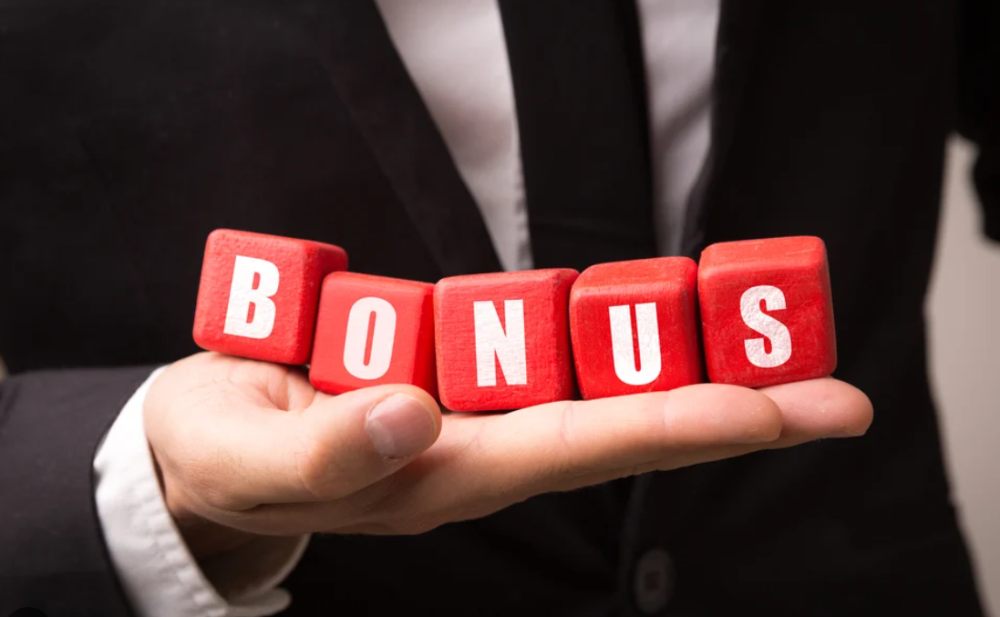

In [ ]:
#@title BONUS: Run the AI model for 1/4° Panguweather (3 mins)
model = "panguweather"
output_path = f"./{model}_20230221_0000"
model2assets = {
    "panguweather":"./pw"
}
assets = model2assets[model]
!ai-models-gfs --input "gfs" --date "20230221" --time "0000" --assets {assets} --path {output_path} --lead "24" "panguweather"

2025-04-22 20:22:17,324 INFO Writing results to ./panguweather_20230221_0000
2025-04-22 20:22:17,324 INFO Loading pressure fields from GFS
File already exists: /tmp/sample_pres.grib, skipping download.
2025-04-22 20:22:29,505 INFO Loading surface fields from GFS
File already exists: /tmp/sample_sfc.grib, skipping download.
2025-04-22 20:22:32,173 INFO Using device 'GPU'. The speed of inference depends greatly on the device.
2025-04-22 20:22:32,173 INFO ONNXRuntime providers: ['CUDAExecutionProvider', 'CPUExecutionProvider']
2025-04-22 20:23:05,675 INFO Loading ./pw/pangu_weather_24.onnx: 33 seconds.
2025-04-22 20:23:06,317 INFO Starting date is 2023-02-21 00:00:00
2025-04-22 20:23:06,317 INFO Writing input fields
2025-04-22 20:23:07,591 INFO Writing step 0: 1 second.
2025-04-22 20:23:07,591 INFO Model initialisation: 50 seconds
2025-04-22 20:23:07,591 INFO Starting inference for 1 steps (24h).
2025-04-22 20:23:15,386 INFO Done 1 out of 1 in 7 seconds (24h), ETA: 7 seconds.
2025-04-22 2

In [ ]:
#@title BONUS: Quick check of GRIB2 output "panguweather_20230221_0000" (1 sec)
print(os.listdir())

['.config', 'fourcastnetv2-small_20230221_0000.nc', 'panguweather_20230221_0000', 'gc', 'pw', 'graphcast-1p00_20230221_0000.nc', 'fcnv2', 'panguweather_20230221_0000.nc', 'sample_data']


In [ ]:
#@title Optional: Download the Panguweather GRIB2 file to your local directory
from google.colab import files
files.download('panguweather_20230221_0000')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title BONUS: Run the AI model for Aurora (3 mins)
model = "aurora-2.5-finetuned"
output_path = f"./{model}_20230221_0000"
model2assets = {
    "aurora-2.5-finetuned":"./au"
}
assets = model2assets[model]
!ai-models-gfs --input "gfs" --date "20230221" --time "0000" --assets {assets} --path {output_path} --lead "24" "aurora-2.5-finetuned"

2025-04-22 16:52:11,697 INFO Writing results to ./aurora-2.5-finetuned_20230221_0000
2025-04-22 16:52:11,697 INFO Model is Aurora0p25FineTuned, use_lora=True
2025-04-22 16:52:34,621 INFO Using device 'CUDA'. The speed of inference depends greatly on the device.
2025-04-22 16:52:36,772 INFO Loading Aurora model from ./au/aurora-0.25-finetuned.ckpt
2025-04-22 16:52:58,341 INFO Loading Aurora model to device cuda
2025-04-22 16:52:58,353 INFO Loading pressure fields from GFS
File already exists: /tmp/sample_pres.grib, skipping download.
File already exists: /tmp/sample_pres.grib, skipping download.
2025-04-22 16:53:19,005 INFO Loading surface fields from GFS
File already exists: /tmp/sample_sfc.grib, skipping download.
File already exists: /tmp/sample_sfc.grib, skipping download.
2025-04-22 16:53:26,464 INFO Starting date is 2023-02-21 00:00:00
2025-04-22 16:53:26,465 INFO Writing input fields
2025-04-22 16:53:27,865 INFO Writing step 0: 1 second.
2025-04-22 16:53:27,924 INFO Starting infe

In [ ]:
#@title BONUS: Quick check of GRIB2 output "aurora-2.5-finetuned_20230221_0000" (1 sec)
print(os.listdir())

['.config', 'au', 'fourcastnetv2-small_20230221_0000.nc', 'panguweather_20230221_0000', 'gc', 'aurora-2.5-finetuned_20230221_0000', 'pw', 'graphcast-1p00_20230221_0000.nc', 'fcnv2', 'panguweather_20230221_0000.nc', 'sample_data']


In [ ]:
#@title Optional: Download the Aurora GRIB2 file to your local directory
from google.colab import files
files.download('aurora-2.5-finetuned_20230221_0000')